In [1]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [2]:
import os
# check the current path
print(os.getcwd()) # /content

# You should copy the path : 왼쪽 폴더에서 오른쪽 버튼 후 경로복사
os.chdir('/content/gdrive/MyDrive/Colab Notebooks/2024_OSP_SW')

print(os.getcwd()) # path has been changed

/content
/content/gdrive/MyDrive/Colab Notebooks/2024_OSP_SW


## 1.라이브러리 설치

In [3]:
!pip install torch torchvision torchaudio

In [4]:
!pip install retinaface-pytorch

In [5]:
!pip install efficientnet-pytorch

In [6]:
!pip install albumentations

In [7]:
!pip install timm

## 2. 데이터셋 준비

metafile.json을 Pandas DataFrame으로 읽기

In [8]:
import json
import pandas as pd

json_file = '/content/gdrive/MyDrive/Colab Notebooks/2024_OSP_SW/train_sample_videos/metadata.json'
df = pd.read_json(json_file)
df = df.T

df.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


In [9]:
df.loc['aagfhgtpmv.mp4'].label

'FAKE'

## 2-1. 데이터셋 메인 준비

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/usr/local/lib/python3.10/dist-packages/torch/hub.py:870: FutureWarning: Falling back to the old format < 1.6. This support will be deprecated in favor of default zipfile format introduced in 1.6. Please redo torch.save() to save it in the new zipfile format.
  return _legacy_zip_load(cached_file, model_dir, map_location, weights_only)


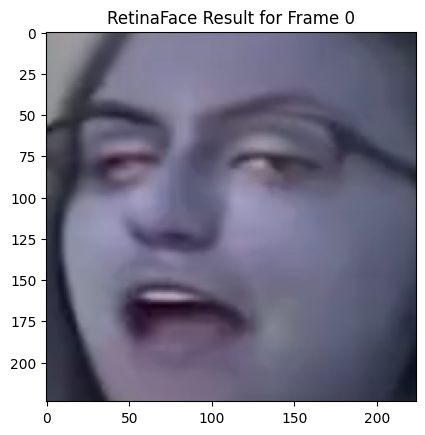

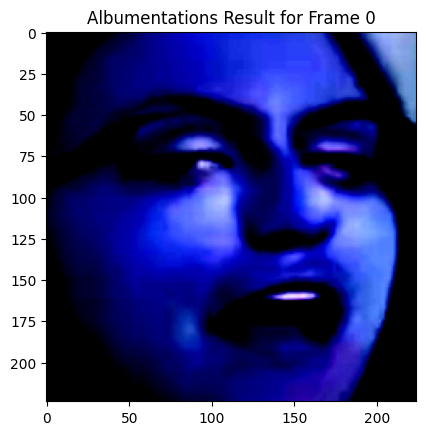

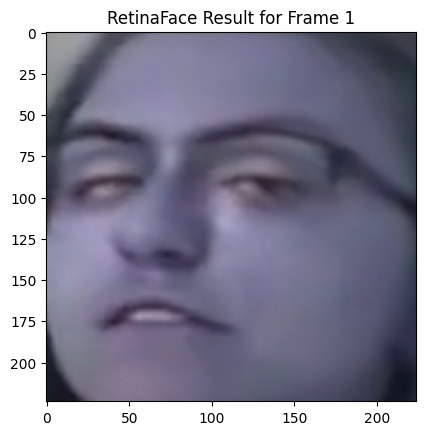

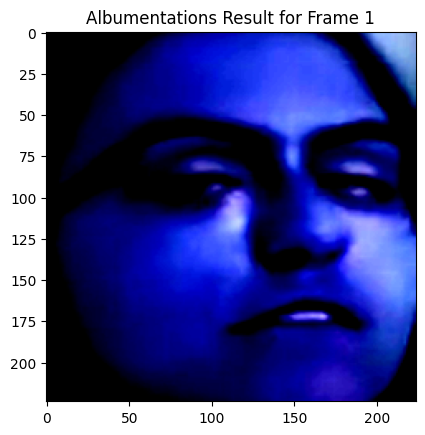

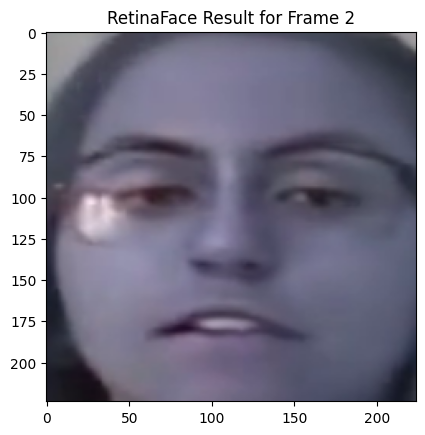

...

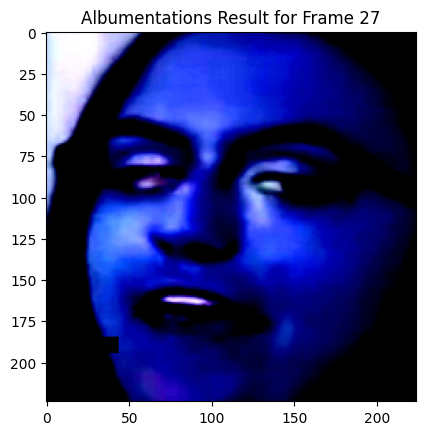

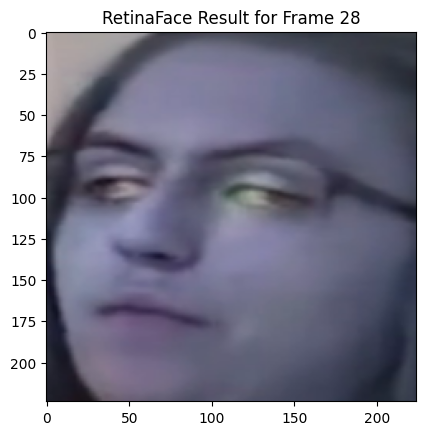

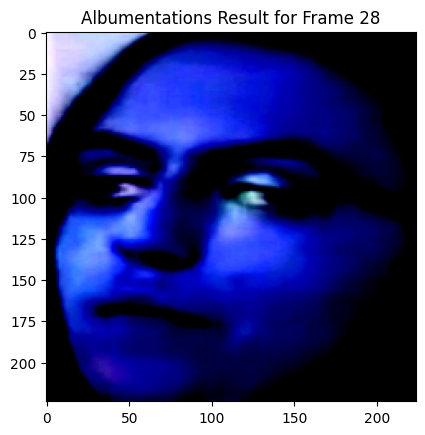

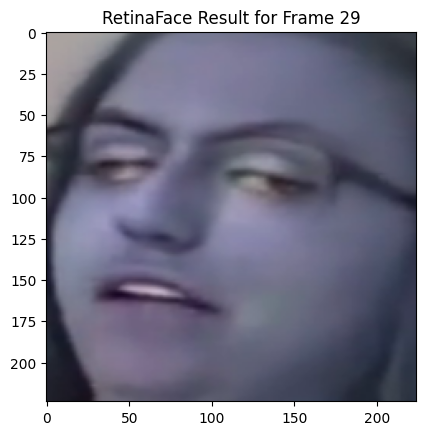

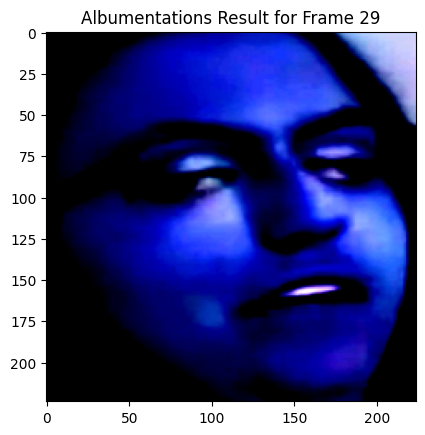

Frames shape: torch.Size([30, 3, 224, 224])
Labels shape: torch.Size([])


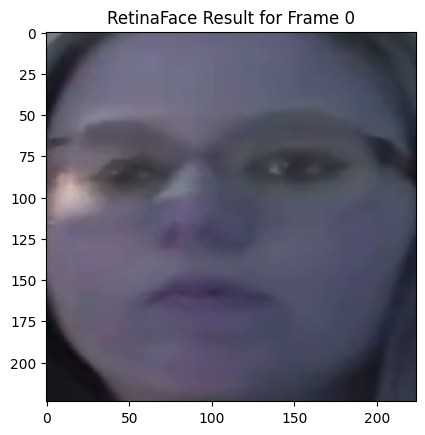

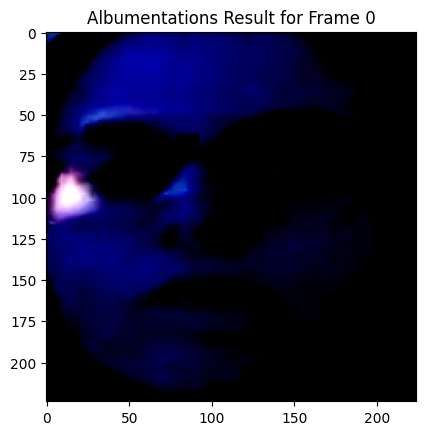

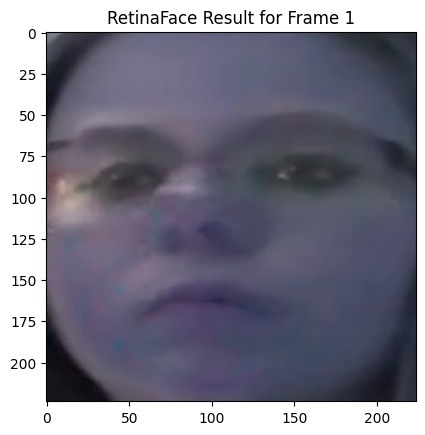

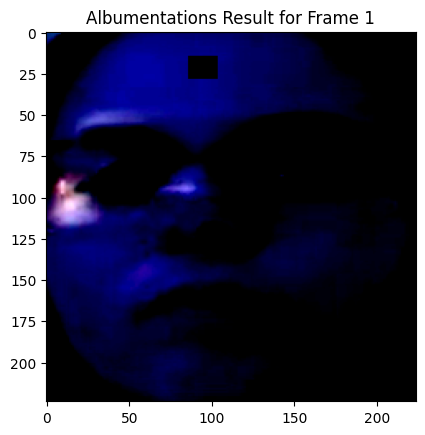

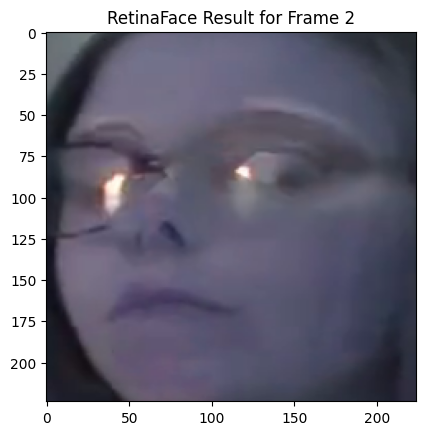

...

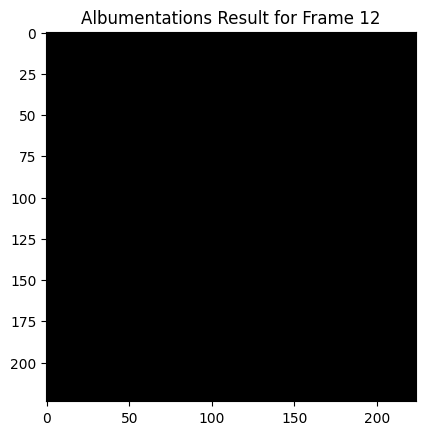

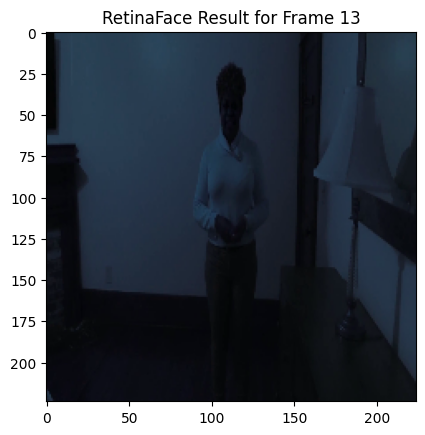

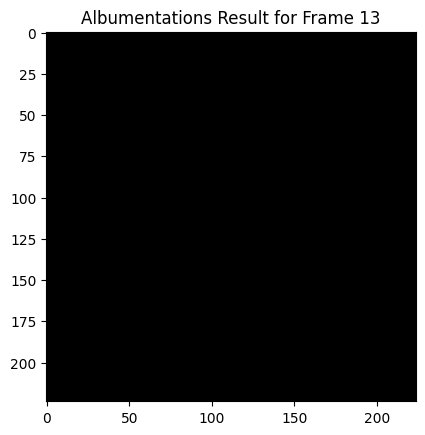

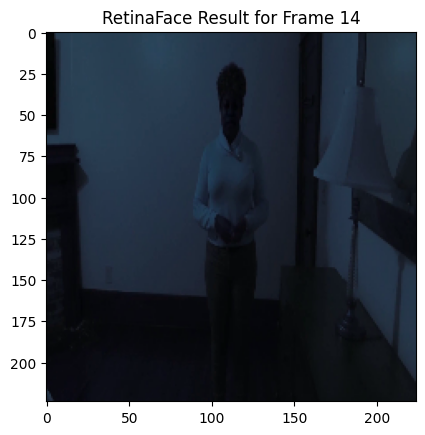

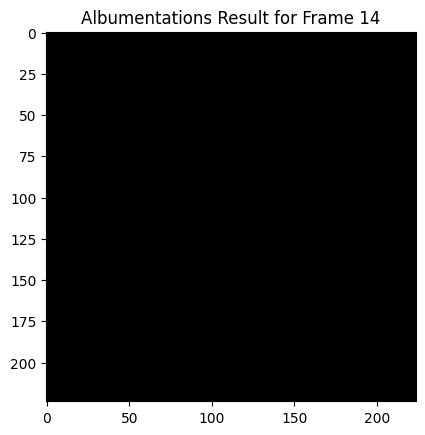

KeyboardInterrupt: 

In [31]:
import os
import cv2
import torch
import pandas as pd
from torch.utils.data import Dataset, DataLoader
from retinaface.pre_trained_models import get_model as get_retinaface_model
import albumentations as A
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt

# RetinaFace 모델 로드
retinaface_model = get_retinaface_model("resnet50_2020-07-20", max_size=224)
retinaface_model.eval()

# 사용자 데이터셋 경로
train_dir = '/content/gdrive/MyDrive/Colab Notebooks/2024_OSP_SW/train_sample_videos'
test_dir = '/content/gdrive/MyDrive/Colab Notebooks/2024_OSP_SW/test_videos'

class RetinaFacePreprocess:
    def __call__(self, image):
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        faces = retinaface_model.predict_jsons(image) # Retinaface detection
        if faces:
            try:
                x1, y1, x2, y2 = faces[0]["bbox"] # get bounding box corner coordinates
                image = image[int(y1):int(y2), int(x1):int(x2)] # crop a face image from the image
            except ValueError:
                pass
        return cv2.resize(image, (224, 224)) # resize the face image ---> 몇 개의 추출 얼굴에 대해서 확인 필요

# Albumentations 전용 변환 설정 ---> 실제 몇 개의 얼굴에 대해서 확인해 보고 유효할지 판단 필요
### !!!! 성능을 올리려면 여기를 해야함 !!!!
albumentations_transform_train = A.Compose([
    A.HorizontalFlip(p=0.5), # 확률이 0.5 이미지
    # Random Erasing or Cutout 구현 함수: 인수를 조정해서 구현하는 일반 함수임
    A.CoarseDropout(num_holes_range=(1, 1),
                    hole_height_range=(10, 20),
                    hole_width_range=(10, 20),
                    fill_value=0,
                    p=0.8),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
])
albumentations_transform_val = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
])

class VideoFrameDataset(Dataset):
    def __init__(self, video_dir, preprocess, albumentations_transform=None, num_frames=10, display=False, use_dummy_label=False):
        self.video_dir = video_dir
        self.preprocess = preprocess
        self.albumentations_transform = albumentations_transform
        self.to_tensor = ToTensor()
        self.num_frames = num_frames
        self.video_files = [f for f in os.listdir(video_dir) if f.endswith('.mp4')]
        self.display = display
        self.use_dummy_label = use_dummy_label

    def __len__(self):
        return len(self.video_files)

    def __getitem__(self, idx):
        video_path = os.path.join(self.video_dir, self.video_files[idx])

#        print(self.video_files[idx])
        if not self.use_dummy_label:
            label_name = df.loc[self.video_files[idx]].label
#            label = [1, 0] if label_name == 'FAKE' else [0, 1] # label을 (datasize, 2) 형태로 만들기 위해
            if label_name == 'FAKE':
                label = 1
            else:
                label = 0
        else:
            label = 0 # dummy label

#        print(label)
        # if label_name == 'FAKE':
        #     label = 1
        # else:
        #     label = 0

        # 비디오에서 특정 간격으로 num_frames 만큼의 프레임 추출
        cap = cv2.VideoCapture(video_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) # 동영상의 전체 프레임 수 = 300 ?
        frame_num = max(total_frames // self.num_frames, 1) # 30, self.num_frames = 10

        frames = []
        labels = []

        for i in range(frame_num):
            cap.set(cv2.CAP_PROP_POS_FRAMES, i * self.num_frames) # 각 10개의 frames에서 맨 처음 frame을 이미지로 추출해서 사용. 그래서, 동영상 당 총 30장의 이미지
            success, frame = cap.read()
            if not success:
                print(f"Warning: Could not read frame {i} in {video_path}. Skipping.")
                continue

            # 얼굴 추출
            face = self.preprocess(frame)
            face = cv2.cvtColor(face, cv2.COLOR_RGB2BGR) # RGB -> BGR

            if self.display:
                plt.imshow(face)
                plt.title(f"RetinaFace Result for Frame {i}")
                plt.show()

            if self.albumentations_transform:
                face = self.albumentations_transform(image=face)['image']
                if self.display:
                    plt.imshow(face)
                    plt.title(f"Albumentations Result for Frame {i}")
                    plt.show()

            face = self.to_tensor(face)
            frames.append(face)
            label_tensor = torch.tensor(label)
#            label_tensor = label_tensor.unsqueeze(1)
            labels.append(label_tensor)

        cap.release()

        # 프레임들을 텐서로 쌓아서 반환
        frames = torch.stack(frames) # list ---> tensor [30, 3, 224, 224]
#        labels = torch.tensor(labels, dtype=torch.float)
#        labels = labels.unsqueeze(1)
#        print(labels)
        labels = torch.stack(labels)

        return frames, torch.tensor(label, dtype=torch.float)

train_dataset = VideoFrameDataset(train_dir, preprocess=RetinaFacePreprocess(), albumentations_transform=albumentations_transform_train, display=False)
test_dataset = VideoFrameDataset(test_dir, preprocess=RetinaFacePreprocess(), albumentations_transform=albumentations_transform_val, display=True, use_dummy_label=True)


#########################################
# train_dataset와 test_dataset의 shape을 맞춰줘야 함
# frames[1500, 3, 244, 244]와 labels[1500, 1] 모두: 50개 파일 * 파일당 이미지 30개 = 1500개 이미지와 그에 해당하는 라벨
for frames, labels in train_dataset:
    print(f"Frames shape: {frames.shape}") # [30, 3, 224, 224]
    print(f"Labels shape: {labels.shape}") # [] -> [30, 1]  <--- VideoFrameDataset 코드 수정
    break

# train_dataset과 test_dataset를 50개 파일의 [30, 3, 224, 224]와 [30, 1]을 합쳐서 [1500, 3, 224, 224], [1500, 1]
# stack 함수로 합칠 것: frames = torch.stack(frames)에서 torch.stack()함수 이용
########################################



# DataLoader로 데이터 확인
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)

# 데이터 확인을 위한 반복문: squeeze() or unsqueeze()
#cnt=1
for frames, labels in train_loader:
#    print(cnt)
    print(f"Frames shape: {frames.shape}") # torch.Size([batch_size, 3, 224, 224])
    print(f"Labels shape: {labels.shape}") # torch.Size([batch_size, 1])
    break
#    cnt += 1


1. Ratinaface 결과를 몇개의 이미지에 대해서 imshow로 확인할 것
2. alnumentation 결과도 확인해 imshow로 볼 것
3. label이 (datasize, 2)인지 확인할

In [12]:
#import os
#os.cpu_count()

In [13]:
#T4 GPU성능 확인 위해서 적은 거임
#!nvidia-smi

## 3. 데이터로더 준비

In [14]:
"""
import torch
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt

# 데이터셋 인스턴스 생성
dataset = VideoFrameDataset(
    train_dir,
    preprocess=RetinaFacePreprocess(),
    albumentations_transform=albumentations_transform_train
)

# DataLoader 설정 (CPU 연결 시)
dataset_loader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)

# 배치 단위로 데이터 확인
for data, labels in dataset_loader:
    print("Data shape:", data.shape)  # (batch_size, num_frames, 3, 224, 224)
    print("Labels shape:", labels.shape)  # (batch_size, 2)

    # 첫 번째 비디오의 첫 번째 프레임을 시각화
    img = data[0][0].permute(1, 2, 0).cpu().numpy()  # 텐서를 이미지로 변환
    plt.imshow(img)
    plt.title("First Frame of First Video in Batch")
    plt.show()
    break

# dataset = VideoFrameDataset(train_dir, preprocess=RetinaFacePreprocess())
# ## 아래는 CPU 연결할 때 사용 : colab에서 CPU 지원 수가 2개이므로, num_workers수도 1~2개
# dataset_loader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)
# ## 아래는 GPU 연결할 때 사용 num_workers가 1 또는 2여야 성능이 무리가 없음
# #dataset_loader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)
"""

'\nimport torch\nfrom torch.utils.data import DataLoader\nfrom matplotlib import pyplot as plt\n\n# 데이터셋 인스턴스 생성\ndataset = VideoFrameDataset(\n    train_dir,\n    preprocess=RetinaFacePreprocess(),\n    albumentations_transform=albumentations_transform_train\n)\n\n# DataLoader 설정 (CPU 연결 시)\ndataset_loader = DataLoader(dataset, batch_size=16, shuffle=True, num_workers=1)\n\n# 배치 단위로 데이터 확인\nfor data, labels in dataset_loader:\n    print("Data shape:", data.shape)  # (batch_size, num_frames, 3, 224, 224)\n    print("Labels shape:", labels.shape)  # (batch_size, 2)\n\n    # 첫 번째 비디오의 첫 번째 프레임을 시각화\n    img = data[0][0].permute(1, 2, 0).cpu().numpy()  # 텐서를 이미지로 변환\n    plt.imshow(img)\n    plt.title("First Frame of First Video in Batch")\n    plt.show()\n    break\n\n# dataset = VideoFrameDataset(train_dir, preprocess=RetinaFacePreprocess())\n# ## 아래는 CPU 연결할 때 사용 : colab에서 CPU 지원 수가 2개이므로, num_workers수도 1~2개\n# dataset_loader = DataLoader(dataset, batch_size=16, shuffle=True, num_worke

In [15]:
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=1)
val_pre_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=1)

## 4. 모델 로드 및 수정

In [16]:
import torch
from torchsummary import summary
from efficientnet_pytorch import EfficientNet

import torch.nn as nn

model = EfficientNet.from_pretrained('efficientnet-b7', num_classes=1)

## freeze feature extractor ,Feature Extractor 고정 (Freeze):
## 학습 속도 및 효율을 높이기 위해 필요한 경우,
## 이 부분을 활성화하고 특정 레이어만 학습하도록 조정
#for param in model.parameters():
#    param.requires_grad = False
#del model._fc
#model._fc = nn.Linear(2560, 1)

summary(model, input_size=(3,224,224), device='cpu')


#model = torch.nn.parallel.DistributedDataParallel(model)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

Loaded pretrained weights for efficientnet-b7
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
         ZeroPad2d-1          [-1, 3, 225, 225]               0
Conv2dStaticSamePadding-2         [-1, 64, 112, 112]           1,728
       BatchNorm2d-3         [-1, 64, 112, 112]             128
MemoryEfficientSwish-4         [-1, 64, 112, 112]               0
         ZeroPad2d-5         [-1, 64, 114, 114]               0
Conv2dStaticSamePadding-6         [-1, 64, 112, 112]             576
       BatchNorm2d-7         [-1, 64, 112, 112]             128
MemoryEfficientSwish-8         [-1, 64, 112, 112]               0
          Identity-9             [-1, 64, 1, 1]               0
Conv2dStaticSamePadding-10             [-1, 16, 1, 1]           1,040
MemoryEfficientSwish-11             [-1, 16, 1, 1]               0
         Identity-12             [-1, 16, 1, 1]               0
Conv2dStaticSamePadding-13        

## 5. 손실 함수 및 옵티마이저 설정

In [17]:
import torch.nn as nn
import torch.optim as optim

# BCEWithLogitsLoss는 이진 분류에 적합하며, 내부적으로 sigmoid 활성화 함수를 포함하고 있음
criterion = nn.BCEWithLogitsLoss()

# 옵티마이저 설정: Adam
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# 손실 함수와 옵티마이저 확인
print("Loss Function:", criterion)
print("Optimizer:", optimizer)

Loss Function: BCEWithLogitsLoss()
Optimizer: Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    capturable: False
    differentiable: False
    eps: 1e-08
    foreach: None
    fused: None
    lr: 0.0001
    maximize: False
    weight_decay: 0
)


## 6. 학습 및 검증 루프 정의

In [18]:
import torch
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt

# Random Erasing 데이터 증강 정의
# p=0.5는 50% 확률로 적용, scale과 ratio는 지워질 부분의 크기와 비율 제어
#random_erasing = transforms.RandomErasing(p=0.5, scale=(0.02, 0.2), ratio=(0.3, 3.3), value=0)

# 훈련 루프에서 데이터 증강을 적용하는 함수
def train_one_epoch(model, dataloader, criterion, optimizer, device, log_interval=100):
    model.train()  # 모델을 학습 모드로 설정
    running_loss = 0.0  # 누적 손실 초기화
    correct = 0  # 맞은 예측 수 초기화
    total = 0  # 총 예측 수 초기화

    # 데이터로더에서 배치별로 데이터를 가져옴
    for i, (inputs, labels) in enumerate(dataloader):
        # 입력 이미지에 랜덤 지우기 증강 적용
        inputs = inputs.to(device)  # 입력 데이터를 장치(GPU 또는 CPU)로 이동
#        for j in range(inputs.size(0)):
#            inputs[j] = random_erasing(inputs[j])  # 각 이미지를 랜덤 지우기 증강 적용

        # 첫 번째 배치의 몇 개의 샘플을 시각화하여 증강 확인
#        if i == 0:  # 첫 번째 배치에만 샘플을 출력
#            print("Random Erasing이 적용된 샘플들을 확인합니다:")
#            for k in range(min(5, inputs.size(0))):  # 최대 5개의 샘플을 출력
#                plt.imshow(inputs[k].cpu().permute(1, 2, 0).numpy())  # 채널 순서를 변경하여 이미지 출력
#                plt.show()  # 이미지를 화면에 표시

        # 라벨 데이터를 장치로 이동하고 형식 변환
        labels = labels.to(device).unsqueeze(1).float()  # 라벨을 (batch_size, 2) 형식에 맞춰 변환

        optimizer.zero_grad()  # 옵티마이저의 경사도 초기화
        outputs = model(inputs)  # 모델을 통해 예측 수행
        loss = criterion(outputs, labels)  # 손실 계산
        loss.backward()  # 역전파를 통해 경사도 계산
        optimizer.step()  # 옵티마이저로 가중치 업데이트

        # 예측 결과를 이진 분류에 맞게 0과 1로 변환
        outputs[outputs >= 0.5] = 1
        outputs[outputs < 0.5] = 0

        # 누적 손실 계산
        running_loss += loss.item() * inputs.size(0)
        # 맞춘 예측 수를 합산
        correct += outputs.eq(labels).int().sum()

    # 평균 손실과 정확도를 반환
    return running_loss / len(dataloader), 100 * correct / len(dataloader.dataset)

# 평가 함수는 Random Erasing이 적용되지 않으므로 기존 코드와 동일하게 유지
def evaluate(model, dataloader, criterion, device):
    model.eval()  # 모델을 평가 모드로 설정
    running_loss = 0.0  # 누적 손실 초기화
    correct = 0  # 맞은 예측 수 초기화
    total = 0  # 총 예측 수 초기화

    with torch.no_grad():  # 평가에서는 경사도를 계산하지 않음
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            labels = labels.unsqueeze(1).float()
            loss = criterion(outputs, labels)

            # 예측 결과를 이진 분류에 맞게 0과 1로 변환
            outputs[outputs >= 0.5] = 1
            outputs[outputs < 0.5] = 0

            # 누적 손실 계산
            running_loss += loss.item() * inputs.size(0)
            # 맞춘 예측 수를 합산
            correct += outputs.eq(labels).int().sum()

    # 평균 손실과 정확도를 반환
    return running_loss / len(dataloader), 100 * correct / len(dataloader.dataset)

## 7. 모델 학습

In [19]:
import copy
import torch
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.optim as optim
from efficientnet_pytorch import EfficientNet

# 모델 설정
#model = EfficientNet.from_pretrained('efficientnet-b7', num_classes=1)  # 이진 분류를 위한 출력 1개 설정
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
#model = model.to(device)

# 손실 함수 및 옵티마이저 설정
criterion = nn.BCEWithLogitsLoss()  # 이진 분류에 적합한 BCEWithLogitsLoss 사용
optimizer = optim.Adam(model.parameters(), lr=1e-4)

train_dataset = VideoFrameDataset(train_dir, preprocess=RetinaFacePreprocess(), albumentations_transform=albumentations_transform_train, display=False)

# Train과 Test DataLoader 설정
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=1)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=1)

# Train 함수 정의
def train_one_epoch(model, dataloader, criterion, optimizer, device, log_interval=100):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for batch_idx, (inputs, labels) in enumerate(dataloader):
        inputs, labels = inputs.to(device), labels.to(device)

        # 이진 분류이므로 labels의 형태를 (batch_size, 1)로 맞춤
        labels = labels.unsqueeze(1).float()

        print(inputs.shape) # (16, 224, 224, 3)
        print(labels.shape) # (16, 1)

        optimizer.zero_grad()

        # 프레임별로 모델에 입력
        batch_loss = 0.0
        batch_correct = 0
        for frame_idx in range(inputs.size(1)):  # num_frames dimension
            frame = inputs[:, frame_idx, :, :, :]  # (batch_size, channels, height, width)
            outputs = model(frame)
            loss = criterion(outputs, labels)
            batch_loss += loss.item()

            # 정확도 계산
            preds = (outputs >= 0).float()
            batch_correct += (preds == labels).sum().item()

        # 평균 손실 및 정확도 계산
        batch_loss /= inputs.size(1)
        running_loss += batch_loss * inputs.size(0)
        correct += batch_correct
        total += labels.size(0)

        # 역전파 및 최적화
        loss = torch.tensor(batch_loss, requires_grad=True)
        loss.backward()
        optimizer.step()

        # 로그 간격마다 출력
        if (batch_idx + 1) % log_interval == 0:
            print(f'Batch [{batch_idx + 1}/{len(dataloader)}], Loss: {batch_loss:.4f}')

    # 에포크 단위 손실과 정확도 반환
    epoch_loss = running_loss / len(dataloader.dataset)
    epoch_accuracy = 100 * correct / total
    return epoch_loss, epoch_accuracy

# Test 함수 정의
def evaluate(model, dataloader, device):
    model.eval()  # 모델을 평가 모드로 전환
    predictions = []

    with torch.no_grad():
        for inputs in dataloader:
            inputs = inputs.to(device)
            preds = []

            # 프레임별로 모델에 입력
            for frame_idx in range(inputs.size(1)):  # num_frames dimension
                frame = inputs[:, frame_idx, :, :, :]  # (batch_size, channels, height, width)
                outputs = model(frame)
                preds.append((outputs >= 0).float().cpu().numpy())

            # 프레임별 예측값을 집계하여 최종 예측값으로 저장
            predictions.extend(preds)

    return predictions

# 학습 설정
num_epochs = 20
best_val_acc = 0.0
best_model_wts = copy.deepcopy(model.state_dict())

for epoch in range(num_epochs):
    # Train 데이터셋 학습 (라벨이 있음)
    train_loss, train_acc = train_one_epoch(model, train_loader, criterion, optimizer, device)
    print(f"Epoch {epoch + 1}/{num_epochs}")
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f}")

    # Test 데이터셋 예측 (라벨이 없음)
    predictions = evaluate(model, test_loader, device)

    # 예측값 출력 (처음 10개만 예시로 표시)
    print(f"Test Predictions (first 10): {predictions[:10]}")

    # 모델의 성능 개선 여부 확인
    if train_acc > best_val_acc:
        best_val_acc = train_acc
        best_model_wts = copy.deepcopy(model.state_dict())

# 가장 성능 좋은 가중치로 모델 업데이트
model.load_state_dict(best_model_wts)

RuntimeError: Caught RuntimeError in DataLoader worker process 0.
Original Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/worker.py", line 351, in _worker_loop
    data = fetcher.fetch(index)  # type: ignore[possibly-undefined]
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/fetch.py", line 55, in fetch
    return self.collate_fn(data)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/collate.py", line 398, in default_collate
    return collate(batch, collate_fn_map=default_collate_fn_map)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/collate.py", line 211, in collate
    return [
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/collate.py", line 212, in <listcomp>
    collate(samples, collate_fn_map=collate_fn_map)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/collate.py", line 155, in collate
    return collate_fn_map[elem_type](batch, collate_fn_map=collate_fn_map)
  File "/usr/local/lib/python3.10/dist-packages/torch/utils/data/_utils/collate.py", line 271, in collate_tensor_fn
    out = elem.new(storage).resize_(len(batch), *list(elem.size()))
RuntimeError: Trying to resize storage that is not resizable
